<a href="https://colab.research.google.com/github/mdb2000/UNFCCC-Human-mobility/blob/Python-codes/BERT_clusterization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
from nltk.corpus import stopwords, wordnet
from transformers import BertTokenizer, BertModel
import nltk
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
import spacy
import re
from nltk.tokenize import word_tokenize

In [ ]:
# Download the nltk stopwords list if not already downloaded
#nltk.download('stopwords')

In [ ]:
# Load data
df = pd.read_csv('C:\\Users\\3104470\\Desktop\\output\\sentences datasets\\long version filtered eng&duplicates\\noduplicates_merged_dataset.csv')

In [ ]:
df.head()

,Document_ID,Sentence,Sentence_ID
0,18_Act,the information that is gathered can then be a...,Act_sent_1
1,18_Act,in many tools the idea of using seasonal calen...,Act_sent_2
2,18_Act,the participation of indigenous peoples repres...,Act_sent_3
3,53_Act,during the final informal consultation only th...,Act_sent_4
4,79_Act,advance unedited version decision cma4 action ...,Act_sent_5


In [ ]:
# Load pre-trained BERT model and tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

In [ ]:
# Initialize spaCy model
nlp = spacy.load('en_core_web_sm')
# Function to check if a word is in the English vocabulary
def is_english_word(word):
    return bool(wordnet.synsets(word))

In [ ]:
# Use NLTK's built-in stopwords list
custom_stopwords = set(stopwords.words('english'))

# Additional custom words to remove, i.e. for frequently used words
additional_stopwords = [
    'climate', 'change', 'displacement', 'migration', 'also', 'include', 'fo', 'ni',
    # Add other words you want to remove here
]

# Update the stopwords set with additional custom words
custom_stopwords.update(additional_stopwords)

In [ ]:
# preprocessing function
def preprocess_text(text):
    # Clean the text by removing numbers and special characters
    text = re.sub(r'\d+', '', text)  # Remove numbers
    text = re.sub(r'[()]', '', text)  # Remove parentheses

    # Lemmatize and filter tokens using spaCy
    doc = nlp(text)
    cleaned_lemmatized = [
        token.lemma_.lower() for token in doc
        if token.is_alpha and
        token.lemma_.lower() not in custom_stopwords and
        is_english_word(token.lemma_.lower()) and
        len(token.lemma_) > 1  # Ensure token length > 1
    ]

    # Return the cleaned tokens and the original lemmatized tokens
    return cleaned_lemmatized, [token.lemma_ for token in doc]


In [ ]:
processed_data = df['Sentence'].apply(preprocess_text)
df['processed'] = processed_data.apply(lambda x: x[0])  # Cleaned, filtered tokens
df['lemmatized'] = processed_data.apply(lambda x: x[1])  # Original lemmatized tokens

In [ ]:
# Remove duplicates based on the 'processed' column
df_filtered = df.drop_duplicates(subset=['processed'])

# Filter rows where 'processed' column has more than 7 tokens
df_filtered = df_filtered[df_filtered['processed'].apply(lambda x: len(x.split()) > 7)]

In [ ]:
df_filtered[['Document_ID','Sentence_ID', 'Sentence', 'lemmatized','processed']].to_csv('C:/Users/3104470/Desktop/output/sentences datasets/df_final.csv', index=False)

In [ ]:
# Function to get BERT [CLS] token embedding for a sentence
def get_cls_sentence(sentence):
    input_ids = torch.tensor([tokenizer.encode(sentence, add_special_tokens=True, max_length=512, truncation=True)])
    with torch.no_grad():
        outputs = model(input_ids)
        cls_embedding = outputs[0][:, 0, :]
    return cls_embedding.flatten().numpy()


In [ ]:
df= df_filtered

In [ ]:
# Apply BERT to get sentence embeddings
df['sentence_embedding'] = df['Sentence'].apply(get_cls_sentence)

In [ ]:
df['sentence_embedding'].head()

0    [-0.5546945, 0.26433375, -0.13359234, 0.356565...
1    [-0.35486972, -0.17328718, 0.3748158, -0.08848...
2    [-0.8312763, 0.16378486, -0.3887791, 0.1027963...
3    [-0.71431655, 0.24808171, -0.3225286, -0.14217...
4    [-0.80829316, 0.23219925, -0.14806525, -0.1413...
Name: sentence_embedding, dtype: object

In [ ]:
# Convert sentence embeddings to a numpy array for clustering
X = np.vstack(df['sentence_embedding'].values)


In [ ]:
# Apply K-Means clustering with K=20
kmeans = KMeans(n_clusters=20, random_state=42, n_init=10)
df['cluster'] = kmeans.fit_predict(X)

In [ ]:
# Apply t-SNE for dimensionality reduction
tsne_model = TSNE(n_components=2, random_state=42)
X_tsne = tsne_model.fit_transform(X)

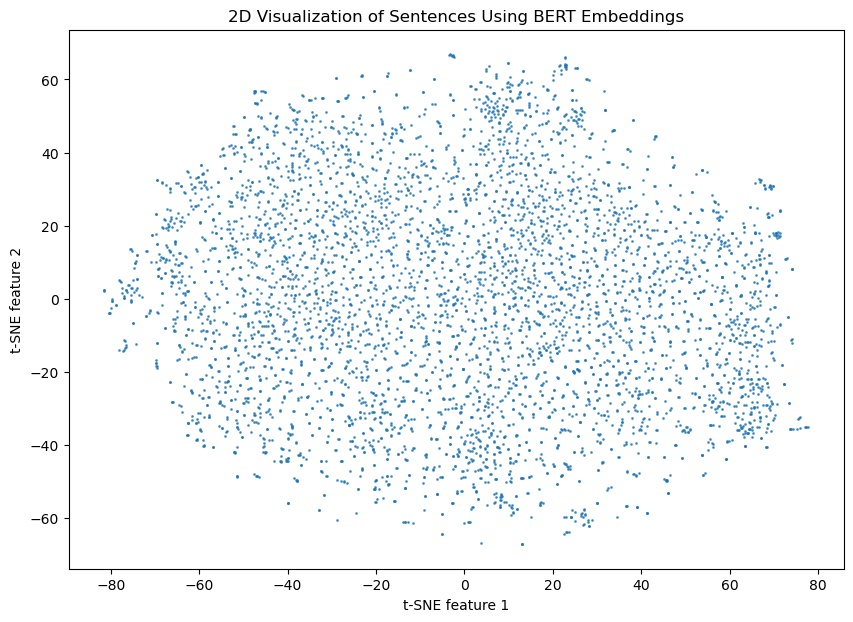

In [ ]:
# Plotting the sentences in 2D space
plt.figure(figsize=(10, 7))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], marker='o', alpha=0.7, s=1)



plt.title("2D Visualization of Sentences Using BERT Embeddings")
plt.xlabel('t-SNE feature 1')
plt.ylabel('t-SNE feature 2')
plt.show()

In [ ]:
plt.savefig('C:\\Users\\3104470\\Desktop\\output\\sentences datasets\\images\\2D_Visualization_BERT_Embeddings.png')

<Figure size 640x480 with 0 Axes>

In [ ]:
# Function to get the most representative words for a cluster
def get_representative_words_for_cluster(cluster_num, top_n=5):
    words_in_cluster = list(itertools.chain(*df[df['cluster'] == cluster_num]['processed']))
    word_counts = Counter(words_in_cluster)
    most_common_words = [word for word, count in word_counts.most_common(top_n)]
    return ' '.join(most_common_words)

# Get representative words for each cluster
cluster_representative_words = [get_representative_words_for_cluster(i) for i in range(20)]


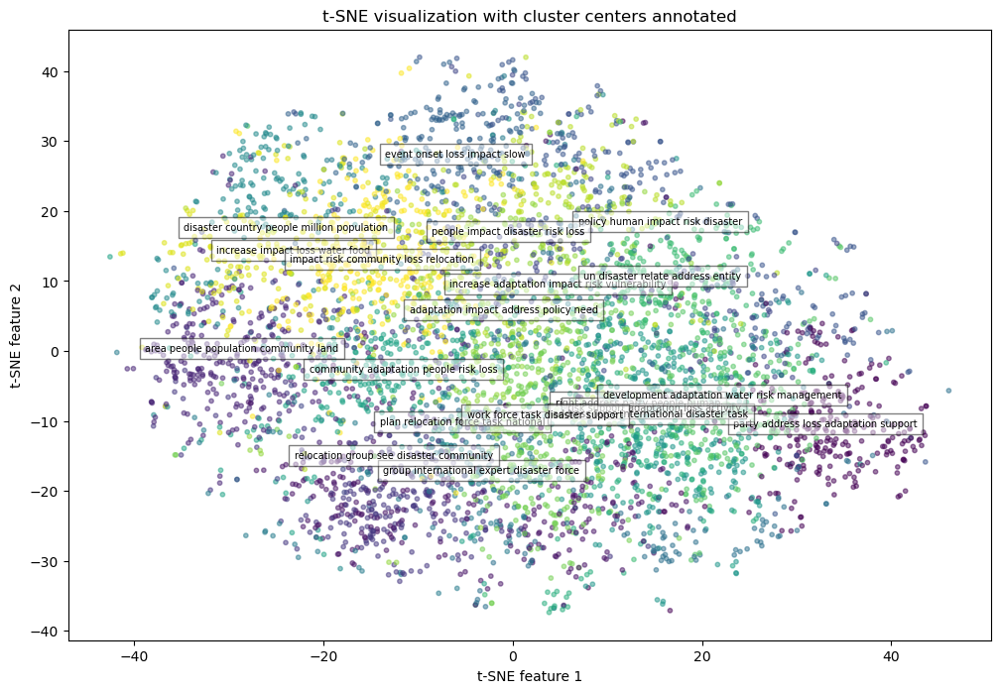

In [ ]:
# Plotting the t-SNE results with cluster centers annotated
plt.figure(figsize=(12, 8))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=df['cluster'], cmap='viridis', s=10, alpha=0.5)

# Annotate clusters using average t-SNE coordinates
for i in range(20):
    cluster_points = X_tsne[df['cluster'] == i]
    cluster_center = cluster_points.mean(axis=0)
    plt.text(cluster_center[0], cluster_center[1], cluster_representative_words[i], fontsize=7, ha='center', bbox=dict(facecolor='white', alpha=0.5))

plt.title('t-SNE visualization with cluster centers annotated')
plt.xlabel('t-SNE feature 1')
plt.ylabel('t-SNE feature 2')
plt.savefig('C:\\Users\\3104470\\Desktop\\output\\sentences datasets\\images\\2D_Visualization_BERT_plusnames.png')
plt.show()

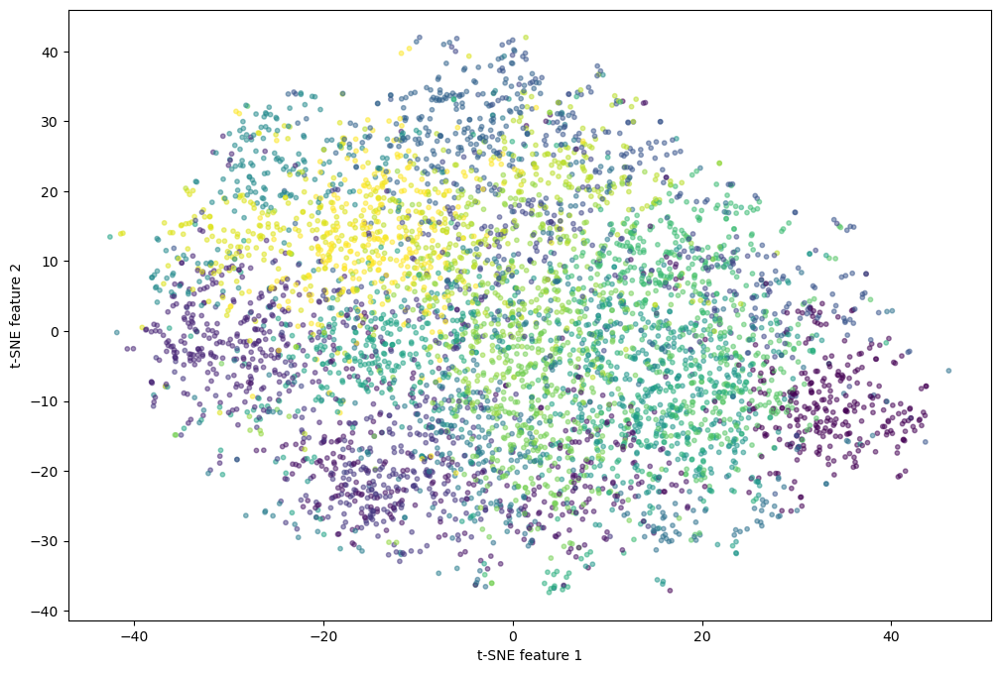

In [ ]:
# Plotting the t-SNE results with cluster centers annotated
plt.figure(figsize=(12, 8))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=df['cluster'], cmap='viridis', s=10, alpha=0.5)

# Annotate clusters using average t-SNE coordinates
for i in range(20):
    cluster_points = X_tsne[df['cluster'] == i]
    cluster_center = cluster_points.mean(axis=0)



plt.xlabel('t-SNE feature 1')
plt.ylabel('t-SNE feature 2')

plt.savefig('C:\\Users\\3104470\\Desktop\\output\\sentences datasets\\images\\2D_Visualization_BERT_Embeddings.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# Apply t-SNE for dimensionality reduction
tsne_model = TSNE(n_components=3, random_state=42)
X_tsne = tsne_model.fit_transform(X)

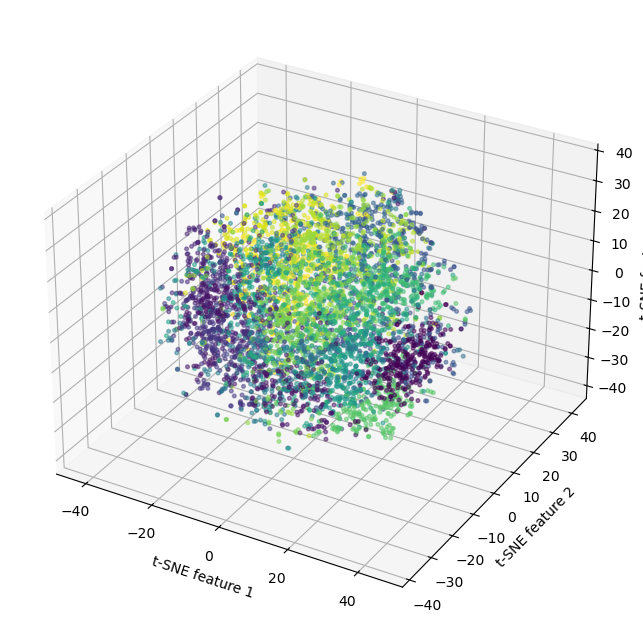

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Plotting the t-SNE results with cluster centers annotated
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2], c=df['cluster'], cmap='viridis', s=7, alpha=0.5)

# Annotate clusters using average t-SNE coordinates
for i in range(20):  # Assuming you have 20 clusters
    cluster_points = X_tsne[df['cluster'] == i]
    cluster_center = cluster_points.mean(axis=0)


# Adding labels and title

ax.set_xlabel('t-SNE feature 1')
ax.set_ylabel('t-SNE feature 2')
ax.set_zlabel('t-SNE feature 3')

plt.savefig('C:\\Users\\3104470\\Desktop\\output\\sentences datasets\\images\\3D_Visualization_BERT_Embeddings.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


In [ ]:
plt.savefig('C:\\Users\\3104470\\Desktop\\output\\sentences datasets\\images\\3D_Visualization_BERT_Embeddings.png', dpi=300, bbox_inches='tight')

<Figure size 640x480 with 0 Axes>

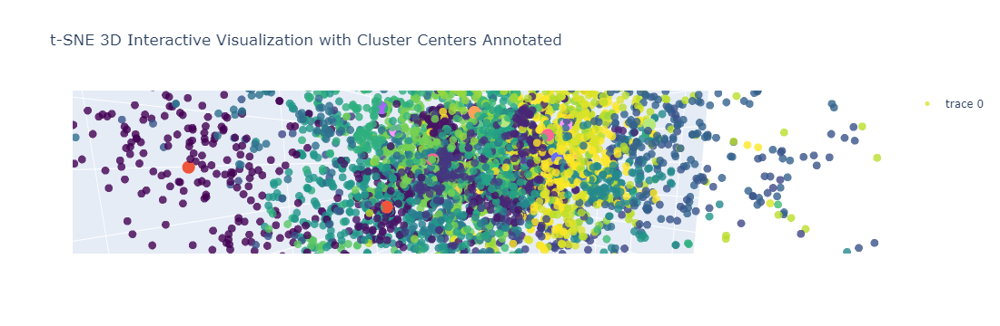

In [ ]:
import plotly.graph_objects as go
import numpy as np

# Create the 3D scatter plot
fig = go.Figure()

# Add points to the scatter plot
fig.add_trace(go.Scatter3d(
    x=X_tsne[:, 0],
    y=X_tsne[:, 1],
    z=X_tsne[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=df['cluster'],  # Set color to the cluster labels
        colorscale='Viridis',  # Color scale
        opacity=0.8
    )
))

# Annotate clusters using average t-SNE coordinates
for i in range(20):  # Assuming you have 20 clusters
    cluster_points = X_tsne[df['cluster'] == i]
    cluster_center = cluster_points.mean(axis=0)
    fig.add_trace(go.Scatter3d(
        x=[cluster_center[0]],
        y=[cluster_center[1]],
        z=[cluster_center[2]],

        showlegend=False
    ))

# Set labels and title
fig.update_layout(
    title='t-SNE 3D Interactive Visualization with Cluster Centers Annotated',
    scene=dict(
        xaxis_title='t-SNE feature 1',
        yaxis_title='t-SNE feature 2',
        zaxis_title='t-SNE feature 3'
    )
)

# Show the plot
fig.show()


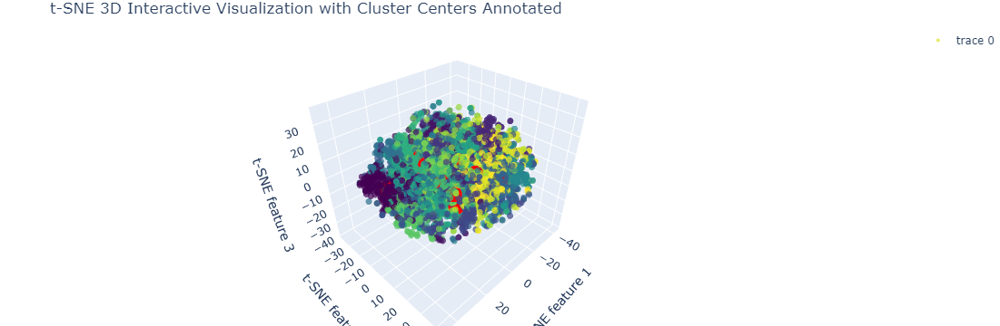

In [ ]:
import plotly.graph_objects as go

# Create the 3D scatter plot
fig = go.Figure()

# Add points to the scatter plot
fig.add_trace(go.Scatter3d(
    x=X_tsne[:, 0],
    y=X_tsne[:, 1],
    z=X_tsne[:, 2],
    mode='markers',
    marker=dict(
        size=4,  # Reduce the marker size for better visibility
        color=df['cluster'],  # Set color to the cluster labels
        colorscale='Viridis',  # Color scale
        opacity=0.7  # Slight transparency to reduce clutter
    ),
    text=df['processed'].apply(lambda x: ' '.join(x)),
    hoverinfo='text'  # Display sentence on hover
))

# Annotate clusters using average t-SNE coordinates
for i in range(20):  # Assuming you have 20 clusters
    cluster_points = X_tsne[df['cluster'] == i]
    cluster_center = cluster_points.mean(axis=0)
    fig.add_trace(go.Scatter3d(
        x=[cluster_center[0]],
        y=[cluster_center[1]],
        z=[cluster_center[2]],
        mode='markers+text',

        marker=dict(
            size=10,  # Larger marker for cluster centers
            color='red',  # Highlight centers with a different color
            opacity=1  # Opaque to ensure visibility
        ),
        showlegend=False
    ))

# Set labels, title, and camera angle
fig.update_layout(
    title='t-SNE 3D Interactive Visualization with Cluster Centers Annotated',
    scene=dict(
        xaxis_title='t-SNE feature 1',
        yaxis_title='t-SNE feature 2',
        zaxis_title='t-SNE feature 3'
    ),
    scene_camera=dict(
        up=dict(x=0, y=0, z=1),  # z-axis pointing up
        center=dict(x=0, y=0, z=0),
        eye=dict(x=1.25, y=1.25, z=1.25)  # Default camera position
    ),
    margin=dict(l=0, r=0, b=0, t=30)  # Reduce margins for a cleaner look
)

# Show the plot
fig.show()


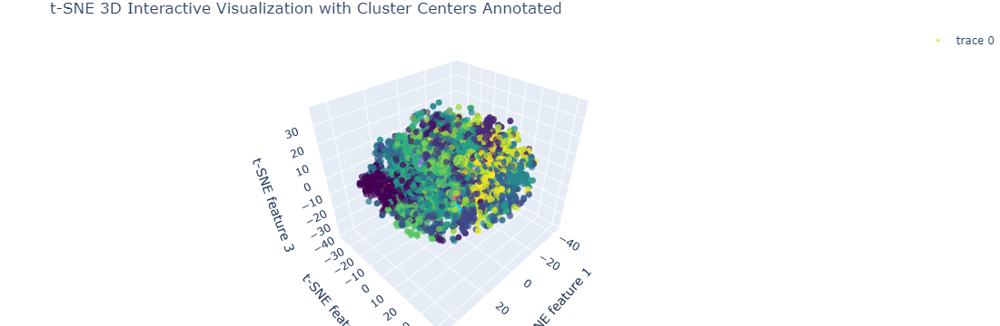

In [ ]:
import plotly.graph_objects as go
from collections import Counter

# Function to get the top 5 most representative tokens
def get_top_tokens(processed_tokens, top_n=5):
    token_counts = Counter(processed_tokens)
    most_common_tokens = token_counts.most_common(top_n)
    return ' '.join([token for token, count in most_common_tokens])

# Apply the function to get the top 5 tokens for each entry
df['top_tokens'] = df['processed'].apply(get_top_tokens)

# Create the 3D scatter plot
fig = go.Figure()

# Add points to the scatter plot
fig.add_trace(go.Scatter3d(
    x=X_tsne[:, 0],
    y=X_tsne[:, 1],
    z=X_tsne[:, 2],
    mode='markers',
    marker=dict(
        size=4,  # Reduce the marker size for better visibility
        color=df['cluster'],  # Set color to the cluster labels
        colorscale='Viridis',  # Color scale
        opacity=0.7  # Slight transparency to reduce clutter
    ),
    text=df['top_tokens'],  # Show the top 5 tokens as hover text
    hoverinfo='text'  # Display top tokens on hover
))

# Annotate clusters using average t-SNE coordinates
for i in range(20):  # Assuming you have 20 clusters
    cluster_points = X_tsne[df['cluster'] == i]
    cluster_center = cluster_points.mean(axis=0)
    fig.add_trace(go.Scatter3d(
        x=[cluster_center[0]],
        y=[cluster_center[1]],
        z=[cluster_center[2]],
        mode='markers+text',

        showlegend=False
    ))

# Set labels, title, and camera angle
fig.update_layout(
    title='t-SNE 3D Interactive Visualization with Cluster Centers Annotated',
    scene=dict(
        xaxis_title='t-SNE feature 1',
        yaxis_title='t-SNE feature 2',
        zaxis_title='t-SNE feature 3'
    ),
    scene_camera=dict(
        up=dict(x=0, y=0, z=1),  # z-axis pointing up
        center=dict(x=0, y=0, z=0),
        eye=dict(x=1.25, y=1.25, z=1.25)  # Default camera position
    ),
    margin=dict(l=0, r=0, b=0, t=30)  # Reduce margins for a cleaner look
)

# Show the plot
fig.show()


In [ ]:
from collections import Counter

# Step 1: Get the five most representative tokens for each cluster
def get_cluster_representative_words(df, cluster_num, top_n=5):
    # Filter the DataFrame to include only rows belonging to the current cluster
    cluster_data = df[df['cluster'] == cluster_num]

    # Aggregate all tokens in the 'processed' column for this cluster
    all_tokens = list(itertools.chain(*cluster_data['processed']))

    # Count the frequency of each token
    token_counts = Counter(all_tokens)

    # Get the top_n most common tokens
    most_common_tokens = token_counts.most_common(top_n)

    # Return the tokens as a space-separated string
    return ' '.join([token for token, count in most_common_tokens])

# Step 2: Generate names for all clusters
num_clusters = 20  # Assuming 20 clusters
cluster_names = {}

for i in range(num_clusters):
    cluster_names[i] = get_cluster_representative_words(df, i)

# Display the cluster names
for cluster_id, cluster_name in cluster_names.items():
    print(f"Cluster {cluster_id}: {cluster_name}")

# Optionally, add these names back into the DataFrame for easy reference
df['cluster_name'] = df['cluster'].apply(lambda x: cluster_names[x])




Cluster 0: party address loss adaptation support
Cluster 1: group international expert disaster force
Cluster 2: area people population community land
Cluster 3: relocation group see disaster community
Cluster 4: increase adaptation impact risk vulnerability
Cluster 5: policy human impact risk disaster
Cluster 6: event onset loss impact slow
Cluster 7: right address party people human
Cluster 8: plan relocation force task national
Cluster 9: disaster country people million population
Cluster 10: risk support adaptation loss activity
Cluster 11: community adaptation people risk loss
Cluster 12: address force international disaster task
Cluster 13: un disaster relate address entity
Cluster 14: development adaptation water risk management
Cluster 15: work force task disaster support
Cluster 16: adaptation impact address policy need
Cluster 17: people impact disaster risk loss
Cluster 18: increase impact loss water food
Cluster 19: impact risk community loss relocation


In [ ]:
import numpy as np

# Step 1: Calculate the cluster centers in the t-SNE space
cluster_centers_tsne = np.array([X_tsne[df['cluster'] == i].mean(axis=0) for i in range(num_clusters)])

# Step 2: Find the representative sentence for each cluster
representative_sentences = {}

for i in range(num_clusters):
    # Get all points belonging to the current cluster
    cluster_points = X_tsne[df['cluster'] == i]

    # Calculate the Euclidean distance from each point to the cluster center
    distances = np.linalg.norm(cluster_points - cluster_centers_tsne[i], axis=1)

    # Find the index of the point with the minimum distance to the cluster center
    min_index = np.argmin(distances)

    # Get the corresponding sentence from the original DataFrame
    representative_sentence = df.loc[df['cluster'] == i].iloc[min_index]['Sentence']

    # Store the representative sentence
    representative_sentences[i] = representative_sentence

# Display the representative sentences for each cluster
for cluster_id, sentence in representative_sentences.items():
    print(f"Cluster {cluster_id}, {cluster_name}:\n representative sentence: {sentence}\n")



Cluster 0, impact risk community loss relocation:
 representative sentence: on the basis of the work undertaken by the executive committee of the warsaw international mechanism for loss and damage associated with climate change impacts the executive committee agreed to forward the following recommendations contained in paragraph x (a)(t) below parties may wish to (a)  to welcome the progress made by the executive committee in implementing its fiveyear rolling workplan (b) to further encourage the executive committee to seek ways to continue enhancing its responsiveness effectiveness and performance in implementing activities in its fiveyear rolling workplan particularly workstream (e) (c) to further encourage parties and invite relevant organizations to make available sufficient resource for the successful and timely implementation of the fiveyear rolling workplan of the executive committee including as applicable the associated expert groups subcommittees panels thematic advisory grou